### Load the data 

In [4]:
from pathlib import Path
import pandas as pd

# Find project root (folder containing 'data')
curr = Path.cwd()
for p in [curr] + list(curr.parents):
    if (p / "data").is_dir():
        PROJECT_ROOT = p
        break
else:
    raise FileNotFoundError("Could not find project root containing a 'data' folder.")

# Load processed file
processed_path = PROJECT_ROOT / "data" / "processed" / "electricity" / "electricity_15min_2021_clean.csv"
print("Loading:", processed_path)

df = pd.read_csv(processed_path, parse_dates=["timestamp"], index_col="timestamp")
display(df.head())
print("Shape:", df.shape)


Loading: c:\Users\gdhungel\PycharmProjects\energy-analysis\data\processed\electricity\electricity_15min_2021_clean.csv


,end,consumption_kWh,flag,timestamp_original
timestamp,,,,
2021-01-01 00:00:00,01.01.2021 00:15,58.8,0,2021-01-01 00:00:00
2021-01-01 00:15:00,01.01.2021 00:30,54.8,0,2021-01-01 00:15:00
2021-01-01 00:30:00,01.01.2021 00:45,52.8,0,2021-01-01 00:30:00
2021-01-01 00:45:00,01.01.2021 01:00,55.6,0,2021-01-01 00:45:00
2021-01-01 01:00:00,01.01.2021 01:15,55.6,0,2021-01-01 01:00:00


Shape: (35040, 4)


### Detect outliers and zero runs

In [ ]:
# Long zero runs (e.g., >= 2 hours = 8 intervals) 
MIN_RUN = 1 

zero_mask = df["consumption_kWh"].eq(0)
grp = (zero_mask != zero_mask.shift()).cumsum()         # run ids
run_len = zero_mask.groupby(grp).transform("size")
df["is_zero_run"] = zero_mask & (run_len >= MIN_RUN)

# Hour-of-day robust outliers (IQR method per hour) 
s = df["consumption_kWh"]
hour = df.index.hour
q1 = s.groupby(hour).transform(lambda x: x.quantile(0.25))
q3 = s.groupby(hour).transform(lambda x: x.quantile(0.75))
iqr = q3 - q1
lb = q1 - 1.5 * iqr
ub = q3 + 1.5 * iqr
df["is_outlier_iqr_hod"] = (s < lb) | (s > ub)

# Combined anomaly flag (either condition)
df["is_anomaly"] = df["is_zero_run"] | df["is_outlier_iqr_hod"]

print("Zero-run anomalies:", int(df["is_zero_run"].sum()))
print("IQR(HoD) outliers:", int(df["is_outlier_iqr_hod"].sum()))
print("Total anomalies:", int(df["is_anomaly"].sum()))


Zero-run anomalies: 1278
IQR(HoD) outliers: 1254
Total anomalies: 1590


In [ ]:
import plotly.graph_objects as go

x = df.index
y = df["consumption_kWh"]
zrun = df["is_zero_run"].fillna(False)
iqr  = df["is_outlier_iqr_hod"].fillna(False)
normal = ~(zrun | iqr) # normal is true where neither zero-run nor IQR outlier flags are True

fig = go.Figure()

# Normal points
fig.add_trace(go.Scatter(
    x=x[normal], y=y[normal],
    mode="lines", line=dict(width=1),
    name="Normal"
))

# Zero-run anomalies
fig.add_trace(go.Scatter(
    x=x[zrun], y=y[zrun],
    mode="markers", marker=dict(size=4),
    name="Zero-run"
))

# IQR(HoD) outliers
fig.add_trace(go.Scatter(
    x=x[iqr], y=y[iqr],
    mode="markers", marker=dict(size=4),
    name="Outlier (IQR HoD)"
))

fig.update_layout(
    title="Electricity – 15-min with Anomalies (2021)",
    xaxis_title="Date",
    yaxis_title="Consumption (kWh)",
    height=520
)

fig.show()


In [ ]:
# another method for outlier detection 
# Median Absolute Deviation (MAD)

import numpy as np

# Median of the series
median_val = df["consumption_kWh"].median()

# Median Absolute Deviation
mad = np.median(np.abs(df["consumption_kWh"] - median_val))

# Robust z-score (using MAD)
robust_z = 0.6745 * (df["consumption_kWh"] - median_val) / mad

# Mark outliers (|z| > 3 is common threshold)
df["is_outlier_mad"] = np.abs(robust_z) > 3

print("MAD:", mad)
print("Median:", median_val)
print("Outlier count:", df["is_outlier_mad"].sum())

# Preview some outliers
display(df[df["is_outlier_mad"]].head(10))

MAD: 18.800000000000004
Median: 76.4
Outlier count: 691


,end,consumption_kWh,flag,timestamp_original,is_zero_run,is_outlier_iqr_hod,is_anomaly,is_outlier_mad
timestamp,,,,,,,,
2021-01-13 11:00:00,13.01.2021 11:15,160.4,0,2021-01-13 11:00:00,False,False,False,True
2021-01-13 12:45:00,13.01.2021 13:00,161.6,0,2021-01-13 12:45:00,False,False,False,True
2021-01-14 09:00:00,14.01.2021 09:15,166.4,0,2021-01-14 09:00:00,False,False,False,True
2021-01-14 11:00:00,14.01.2021 11:15,162.8,0,2021-01-14 11:00:00,False,False,False,True
2021-01-19 11:45:00,19.01.2021 12:00,162.4,0,2021-01-19 11:45:00,False,False,False,True
2021-01-20 09:30:00,20.01.2021 09:45,164.8,0,2021-01-20 09:30:00,False,False,False,True
2021-04-14 09:00:00,14.04.2021 10:15,162.8,0,2021-04-14 10:00:00,False,False,False,True
2021-04-14 12:15:00,14.04.2021 13:30,161.2,0,2021-04-14 13:15:00,False,False,False,True
2021-05-27 08:45:00,27.05.2021 10:00,164.8,0,2021-05-27 09:45:00,False,False,False,True


In [9]:
x = df.index
y = df["consumption_kWh"]
mad_mask = df["is_outlier_mad"].fillna(False)
zrun_mask = df["is_zero_run"].fillna(False)

fig = go.Figure()

# Normal consumption line (no anomalies)
normal_mask = ~(mad_mask | zrun_mask)
fig.add_trace(go.Scatter(
    x=x[normal_mask], y=y[normal_mask],
    mode="lines",
    line=dict(width=1, color="blue"),
    name="Normal"
))

# Zero-run anomalies
fig.add_trace(go.Scatter(
    x=x[zrun_mask], y=y[zrun_mask],
    mode="markers",
    marker=dict(size=5, color="red"),
    name="Zero-run anomaly"
))

# MAD outliers
fig.add_trace(go.Scatter(
    x=x[mad_mask], y=y[mad_mask],
    mode="markers",
    marker=dict(size=5, color="orange"),
    name="MAD outlier"
))

fig.update_layout(
    title="Electricity – 15-min with Zero-run & MAD Outliers (2021)",
    xaxis_title="Date",
    yaxis_title="Consumption (kWh)",
    height=520
)

fig.show()


In [10]:
# The above two outlier detection does not make good sense here 
# So, we go for threshold based outlier detection

# Define thresholds
LOW_THR = 20
HIGH_THR = 250

# Flag extreme outliers
df["is_outlier_thresh"] = (df["consumption_kWh"] < LOW_THR) | (df["consumption_kWh"] > HIGH_THR)

print(f"Threshold outliers: {df['is_outlier_thresh'].sum()} out of {len(df)}")

Threshold outliers: 1280 out of 35040


In [11]:
# PLot

x = df.index
y = df["consumption_kWh"]
thr_mask = df["is_outlier_thresh"].fillna(False)
zrun_mask = df["is_zero_run"].fillna(False)

fig = go.Figure()

# Normal points
normal_mask = ~(thr_mask | zrun_mask)
fig.add_trace(go.Scatter(
    x=x[normal_mask], y=y[normal_mask],
    mode="lines",
    line=dict(width=1, color="blue"),
    name="Normal"
))

# Zero-run anomalies
fig.add_trace(go.Scatter(
    x=x[zrun_mask], y=y[zrun_mask],
    mode="markers",
    marker=dict(size=5, color="red"),
    name="Zero-run anomaly"
))

# Threshold outliers
fig.add_trace(go.Scatter(
    x=x[thr_mask], y=y[thr_mask],
    mode="markers",
    marker=dict(size=5, color="orange"),
    name=f"Threshold outlier (<{LOW_THR} or >{HIGH_THR})"
))

fig.update_layout(
    title="Electricity – 15-min with Zero-run & Threshold Outliers (2021)",
    xaxis_title="Date",
    yaxis_title="Consumption (kWh)",
    height=520
)

fig.show()


### Fill the missing values

In [ ]:
import numpy as np

# --- config ---
WEEK_OFFSETS = [7, 14, 21]     # days to look back/forward for filling values

# Threshold outliers → anomaly mask
anom_mask = df["is_outlier_thresh"].fillna(False)

# Work on a copy
filled = df["consumption_kWh"].copy()

# Find contiguous anomaly blocks
block_id = (anom_mask != anom_mask.shift()).cumsum()
blocks = []
for b in block_id[anom_mask].unique():
    idxs = filled.index[anom_mask & (block_id == b)]
    blocks.append((idxs[0], idxs[-1]))

# Fill each block
for start, end in blocks:
    idx_range = pd.date_range(start, end, freq="15T")

    for ts in idx_range:
        vals = []
        for d in WEEK_OFFSETS:
            for sign in (-1, 1):
                ref_ts = ts + pd.Timedelta(days=sign * d)
                if ref_ts in filled.index:
                    v = filled.loc[ref_ts]
                    # Only take if valid and not itself an outlier
                    if pd.notna(v) and not df.loc[ref_ts, "is_outlier_thresh"]:
                        vals.append(v)
        filled.loc[ts] = (sum(vals) / len(vals)) if vals else np.nan

# Store result and quick summary
df["consumption_kWh_filled"] = filled

n_anom = int(anom_mask.sum())
n_filled = int(df.loc[anom_mask, "consumption_kWh_filled"].notna().sum())
n_nan_after = int(df["consumption_kWh_filled"].isna().sum())

print(f"Anomaly points (threshold): {n_anom}")
print(f"Filled anomaly points:      {n_filled}")
print(f"Remaining NaNs after fill:  {n_nan_after}")


C:\Users\gdhungel\AppData\Local\Temp\ipykernel_19616\4256216305.py:21: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



Anomaly points (threshold): 1280
Filled anomaly points:      1280
Remaining NaNs after fill:  0


In [19]:
df

,end,consumption_kWh,flag,timestamp_original,is_zero_run,is_outlier_iqr_hod,is_anomaly,is_outlier_mad,is_outlier_thresh,consumption_kWh_filled
timestamp,,,,,,,,,,
2021-01-01 00:00:00,01.01.2021 00:15,58.8,0,2021-01-01 00:00:00,False,False,False,False,False,58.8
2021-01-01 00:15:00,01.01.2021 00:30,54.8,0,2021-01-01 00:15:00,False,False,False,False,False,54.8
2021-01-01 00:30:00,01.01.2021 00:45,52.8,0,2021-01-01 00:30:00,False,False,False,False,False,52.8
2021-01-01 00:45:00,01.01.2021 01:00,55.6,0,2021-01-01 00:45:00,False,False,False,False,False,55.6
2021-01-01 01:00:00,01.01.2021 01:15,55.6,0,2021-01-01 01:00:00,False,False,False,False,False,55.6
...,...,...,...,...,...,...,...,...,...,...
2021-12-31 22:45:00,31.12.2021 23:00,57.2,0,2021-12-31 22:45:00,False,False,False,False,False,57.2
2021-12-31 23:00:00,31.12.2021 23:15,66.0,0,2021-12-31 23:00:00,False,False,False,False,False,66.0
2021-12-31 23:15:00,31.12.2021 23:30,66.0,0,2021-12-31 23:15:00,False,False,False,False,False,66.0


In [20]:
# Plot
# Recompute anomaly mask (threshold) and contiguous blocks
anom_mask = df["is_outlier_thresh"].fillna(False)
if not anom_mask.any():
    print("No anomalies flagged with current thresholds.")
else:
    block_id = (anom_mask != anom_mask.shift()).cumsum()
    first_b = block_id[anom_mask].iloc[0]
    block_idx = df.index[anom_mask & (block_id == first_b)]
    b_start, b_end = block_idx[0], block_idx[-1]

    # Add a little context around the block
    pad = pd.Timedelta("6H")
    w_start = b_start - pad
    w_end   = b_end + pad

    # Build masks
    span = (df.index >= w_start) & (df.index <= w_end)
    anom_span = anom_mask & span

    # Plot
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=df.index[span], y=df.loc[span, "consumption_kWh"],
        mode="lines", line=dict(width=1),
        name="Original"
    ))
    fig.add_trace(go.Scatter(
        x=df.index[span], y=df.loc[span, "consumption_kWh_filled"],
        mode="lines", line=dict(width=1),
        name="Filled"
    ))
    fig.add_trace(go.Scatter(
        x=df.index[anom_span], y=df.loc[anom_span, "consumption_kWh"],
        mode="markers", marker=dict(size=6),
        name="Anomaly points"
    ))

    fig.update_layout(
        title=f"Before vs After (first anomaly block: {b_start} → {b_end})",
        xaxis_title="Time", yaxis_title="Consumption (kWh)",
        height=520
    )
    fig.show()


C:\Users\gdhungel\AppData\Local\Temp\ipykernel_19616\2223690372.py:13: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



In [21]:
# Full year before and after filling

fig = go.Figure()

# Original
fig.add_trace(go.Scatter(
    x=df.index,
    y=df["consumption_kWh"],
    mode="lines",
    line=dict(width=1, color="blue"),
    name="Original"
))

# Filled
fig.add_trace(go.Scatter(
    x=df.index,
    y=df["consumption_kWh_filled"],
    mode="lines",
    line=dict(width=1, color="orange"),
    name="Filled"
))

fig.update_layout(
    title="Electricity – Original vs. Filled (Full Year)",
    xaxis_title="Date",
    yaxis_title="Consumption (kWh)",
    height=520
)

fig.show()


### Adjust filled values to match the total consumption values

In [24]:
# Known annual total (kWh)
target_total_kWh = 3118000

# Identify the points we actually replaced
filled_mask = df["consumption_kWh"] != df["consumption_kWh_filled"]

# Compute current totals
current_total = df["consumption_kWh_filled"].sum()
original_total = df["consumption_kWh"].sum()

# How much total energy do we need from the filled points?
target_filled_total = target_total_kWh - (original_total - df.loc[filled_mask, "consumption_kWh_filled"].sum())

# Current total energy from filled points
current_filled_total = df.loc[filled_mask, "consumption_kWh_filled"].sum()

# Scaling factor for filled points only
scale_factor = target_filled_total / current_filled_total

# Apply scaling only to the replaced points
df["consumption_kWh_filled_scaled"] = df["consumption_kWh_filled"].copy()
df.loc[filled_mask, "consumption_kWh_filled_scaled"] *= scale_factor

# Verify totals
print(f"Target total:        {target_total_kWh:,.2f} kWh")
print(f"Original total:      {original_total:,.2f} kWh")
print(f"Target fill total:   {target_filled_total:,.2f} kWh")
print(f"Current fill total:  {current_filled_total:,.2f} kWh")
print(f"Before scaling fill: {current_total:,.2f} kWh")
print(f"After scaling fill:  {df['consumption_kWh_filled_scaled'].sum():,.2f} kWh")
print(f"Scaling factor for filled points: {scale_factor:.6f}")


Target total:        3,118,000.00 kWh
Original total:      2,988,032.31 kWh
Target fill total:   262,326.35 kWh
Current fill total:  132,358.66 kWh
Before scaling fill: 3,120,372.18 kWh
After scaling fill:  3,250,339.86 kWh
Scaling factor for filled points: 1.981936


<Axes: xlabel='timestamp'>

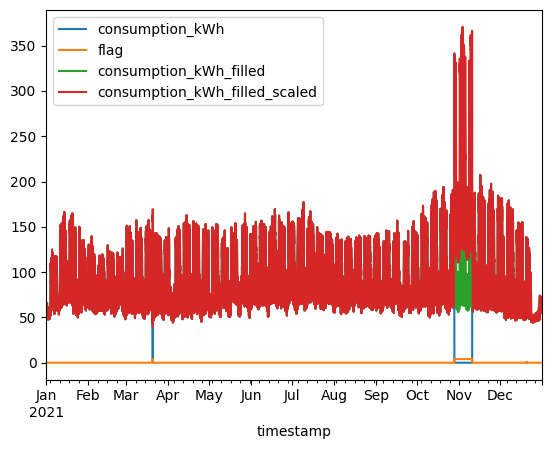

In [ ]:
df["consumption_kWh_filled"].plot()

<Axes: xlabel='timestamp'>

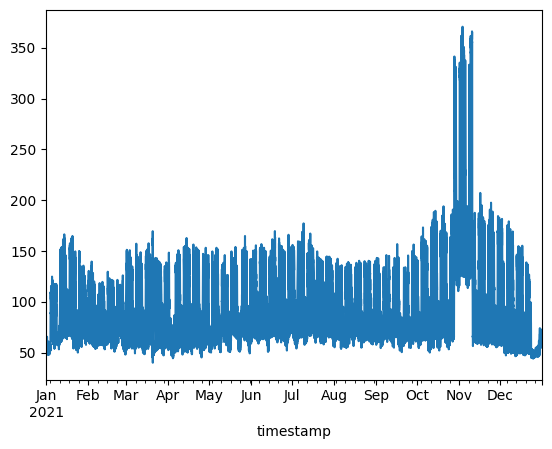

In [27]:
df["consumption_kWh_filled_scaled"].plot()

In [34]:
# scaling by proportional normalization
# Target annual total (kWh)
target_total_kWh = 3118000

y = df["consumption_kWh_filled"]
scale = target_total_kWh / y.sum()

df["consumption_kWh_filled_norm"] = (y * scale).round(2)

print(f"Scale factor: {scale:.6f}")
print("Check total:", df["consumption_kWh_filled_norm"].sum())


Scale factor: 0.999240
Check total: 3117999.0300000003


In [35]:
df

,end,consumption_kWh,flag,timestamp_original,is_zero_run,is_outlier_iqr_hod,is_anomaly,is_outlier_mad,is_outlier_thresh,consumption_kWh_filled,consumption_kWh_filled_scaled,consumption_kWh_filled_norm
timestamp,,,,,,,,,,,,
2021-01-01 00:00:00,01.01.2021 00:15,58.8,0,2021-01-01 00:00:00,False,False,False,False,False,58.8,58.8,58.76
2021-01-01 00:15:00,01.01.2021 00:30,54.8,0,2021-01-01 00:15:00,False,False,False,False,False,54.8,54.8,54.76
2021-01-01 00:30:00,01.01.2021 00:45,52.8,0,2021-01-01 00:30:00,False,False,False,False,False,52.8,52.8,52.76
2021-01-01 00:45:00,01.01.2021 01:00,55.6,0,2021-01-01 00:45:00,False,False,False,False,False,55.6,55.6,55.56
2021-01-01 01:00:00,01.01.2021 01:15,55.6,0,2021-01-01 01:00:00,False,False,False,False,False,55.6,55.6,55.56
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 22:45:00,31.12.2021 23:00,57.2,0,2021-12-31 22:45:00,False,False,False,False,False,57.2,57.2,57.16
2021-12-31 23:00:00,31.12.2021 23:15,66.0,0,2021-12-31 23:00:00,False,False,False,False,False,66.0,66.0,65.95
2021-12-31 23:15:00,31.12.2021 23:30,66.0,0,2021-12-31 23:15:00,False,False,False,False,False,66.0,66.0,65.95


### Plot the original vs filled

In [37]:
import plotly.subplots as sp
import plotly.graph_objects as go

# Create subplots
fig = sp.make_subplots(
    rows=2, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=("Original (Unfilled)", "Filled & Normalized")
)

# Row 1 — original
fig.add_trace(
    go.Scatter(
        x=df.index,
        y=df["consumption_kWh"],
        mode="lines",
        line=dict(width=1, color="blue"),
        name="Original"
    ),
    row=1, col=1
)

# Row 2 — filled
fig.add_trace(
    go.Scatter(
        x=df.index,
        y=df["consumption_kWh_filled_norm"],
        mode="lines",
        line=dict(width=1, color="orange"),
        name="Filled & Norm"
    ),
    row=2, col=1
)

fig.update_layout(
    height=600,
    title_text="Electricity Consumption – Before vs After Filling",
    showlegend=False
)

fig.show()


### Save the selected columns (cleaned, filled, normalised) to csv 

In [36]:
# Select columns to keep (add/remove as you prefer)
cols = [
    "consumption_kWh",              # original 15-min
    "consumption_kWh_filled",       # filled
    "consumption_kWh_filled_norm",  # scaled & rounded
    "timestamp_original",           # traceability
    "is_outlier_thresh"             # anomaly flag used
]

save_dir = Path(PROJECT_ROOT) / "data" / "processed" / "electricity"
save_dir.mkdir(parents=True, exist_ok=True)

out_path = save_dir / "electricity_15min_2021_clean_filled.csv"
df[cols].to_csv(out_path, index_label="timestamp")

print("Saved:", out_path)
print("Rows:", len(df))

Saved: c:\Users\gdhungel\PycharmProjects\energy-analysis\data\processed\electricity\electricity_15min_2021_clean_filled.csv
Rows: 35040
